# 05 — Pipeline Accuracy Evaluation

**Goal:** Run the full CV pipeline against labeled ground-truth boards and measure tile-level accuracy.

**Inputs:**
- `data/labeled-raw/labeled-boards.csv` — 41 labeled boards (easy/medium/hard)
- `data/labeled-raw/*.png` — Board images (PNG, ~3 MP)
- Pre-trained models from notebook 04

**Outputs:**
- Tile accuracy broken down by difficulty
- Per-letter accuracy bar chart
- 32×32 confusion matrix
- Diagnostic figures for failure/low-accuracy boards

**Usage:** Run all cells in order. Cells are self-contained — no outputs from notebook 04 are required.

## A. Setup

In [1]:
import sys
import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
from ultralytics import YOLO

SEED = 67
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

print(f"PyTorch {torch.__version__}, OpenCV {cv2.__version__}")

PyTorch 2.10.0, OpenCV 4.13.0


In [2]:
PROJECT_ROOT = Path.cwd().parent / "prototyping"
DATA_DIR = PROJECT_ROOT / "data"
LABELED_RAW_DIR = DATA_DIR / "labeled-raw"
LABELED_CSV = LABELED_RAW_DIR / "labeled-boards.csv"
LEGACY_DIR = PROJECT_ROOT / "legacy"

BOARD_CLASSES = {65, 66, 67}
YOLO_CONF = 0.25
YOLO_IMGSZ = 640
TARGET_TILE_SIZE = 100
GRID_INSET_RATIO = 0.10

print(f"Labeled CSV: {LABELED_CSV} (exists: {LABELED_CSV.exists()})")
print(f"Labeled images dir: {LABELED_RAW_DIR} (exists: {LABELED_RAW_DIR.exists()})")

# ── Pipeline (shared module) ──────────────────────────────────────────────────
sys.path.insert(0, str(PROJECT_ROOT))

from pipeline import (
    CLASS_LABELS, BOARD_CLASSES, YOLO_CONF, YOLO_IMGSZ, TARGET_TILE_SIZE,
    GRID_INSET_RATIO, WARP_PAD_PCT,
    detect_board, cleanup_mask, fit_quad, order_corners, warp_board,
    find_tile_centers, infer_grid_from_centroids, extract_tiles_from_grid,
    correct_tile_perspective, preprocess_tile_v0,
    predict_tiles_batch,
    analyze_board,
)
print("Pipeline loaded from prototyping/pipeline/")

Labeled CSV: /Users/thubbard/Documents/personal/programming/boggle-vision/prototyping/data/labeled-raw/labeled-boards.csv (exists: True)
Labeled images dir: /Users/thubbard/Documents/personal/programming/boggle-vision/prototyping/data/labeled-raw (exists: True)
Pipeline loaded from prototyping/pipeline/


In [3]:
yolo_model = YOLO(str(PROJECT_ROOT / "yolov8s-seg.pt"))
print("YOLO loaded.")


YOLO loaded.


In [4]:
from pipeline import BoggleCNN

# Toggle CNN version: "v0" (original, 86.8% baseline) or "v2" (retrained)
CNN_VERSION = "v2"

cnn_weights = {
    "v0": LEGACY_DIR / "models" / "boggle_cnn.pth",
    "v2": LEGACY_DIR / "models" / "boggle_cnn_v2.pth",
}

cnn_model = BoggleCNN()
cnn_model.load_state_dict(
    torch.load(cnn_weights[CNN_VERSION], map_location="cpu", weights_only=True)
)
cnn_model.eval()
print(f"CNN {CNN_VERSION} loaded from {cnn_weights[CNN_VERSION].name}")
print(f"  {sum(p.numel() for p in cnn_model.parameters()):,} params, {len(CLASS_LABELS)} classes")

CNN v2 loaded from boggle_cnn_v2.pth
  419,744 params, 32 classes


## B. Pipeline Functions

All pipeline code lives in `prototyping/pipeline/` and is imported in Section A.  
The key fix applied: `find_tile_centers` now filters peaks within `WARP_PAD_PCT` (7 %) of the image border, eliminating the phantom-row artifact that caused T-flooding on misdetected boards.

In [5]:
# Convenience wrapper: passes loaded models so callers don't have to thread them through
def _analyze(img_path):
    return analyze_board(img_path, yolo_model, cnn_model)

## C. Load Labeled Data

In [6]:
def resolve_labeled_path(raw_path):
    """Normalize Windows-style CSV path to actual file in labeled-raw/."""
    return LABELED_RAW_DIR / Path(raw_path.replace("\\", "/")).name


def parse_letter_sequence(seq):
    """Split semicolon-delimited sequence, stripping empty tokens (trailing ;)."""
    return [s.strip() for s in seq.split(";") if s.strip()]


df = pd.read_csv(LABELED_CSV)
df["img_path"] = df["file_path"].map(resolve_labeled_path)
df["gt_labels"] = df["letter_sequence"].map(parse_letter_sequence)
df["img_exists"] = df["img_path"].map(lambda p: p.exists())
df["n_tiles"] = df["gt_labels"].map(len)

print(f"Loaded {len(df)} labeled boards")
print(f"  Difficulty breakdown: {df['difficulty'].value_counts().to_dict()}")
print(f"  Images found: {df['img_exists'].sum()}/{len(df)}")
print(f"  Tile counts: {df['n_tiles'].value_counts().sort_index().to_dict()}")

missing = df[~df["img_exists"]]
if len(missing) > 0:
    print(f"\nMISSING images:")
    for _, row in missing.iterrows():
        print(f"  {row['img_path']}")

df.head(5)


Loaded 40 labeled boards
  Difficulty breakdown: {'easy': 30, 'hard': 5, 'medium': 5}
  Images found: 40/40
  Tile counts: {36: 40}


,file_path,difficulty,letter_sequence,img_path,gt_labels,img_exists,n_tiles
0,data\test-pictures\easy-01.png,easy,Y;G;R;L;H;N;E;T;T;N;T;O;Th;F;E;E;E;N;C;L;E;T;H...,/Users/thubbard/Documents/personal/programming...,"[Y, G, R, L, H, N, E, T, T, N, T, O, Th, F, E,...",True,36
1,data\test-pictures\easy-02.png,easy,BLOCK;U;L;An;L;G;O;B;E;Y;F;O;T;Qu;L;I;G;R;A;N;...,/Users/thubbard/Documents/personal/programming...,"[BLOCK, U, L, An, L, G, O, B, E, Y, F, O, T, Q...",True,36
2,data\test-pictures\easy-03.png,easy,He;N;N;Z;H;L;Y;T;A;I;B;T;S;H;T;G;Y;D;BLOCK;A;G...,/Users/thubbard/Documents/personal/programming...,"[He, N, N, Z, H, L, Y, T, A, I, B, T, S, H, T,...",True,36
3,data\test-pictures\easy-04.png,easy,BLOCK;E;A;F;O;S;E;Th;M;P;W;H;E;I;E;E;J;O;F;R;D...,/Users/thubbard/Documents/personal/programming...,"[BLOCK, E, A, F, O, S, E, Th, M, P, W, H, E, I...",True,36
4,data\test-pictures\hard-04.png,hard,W;In;G;C;F;N;S;N;BLOCK;E;A;O;G;K;T;T;S;U;O;C;A...,/Users/thubbard/Documents/personal/programming...,"[W, In, G, C, F, N, S, N, BLOCK, E, A, O, G, K...",True,36


## D. Run Pipeline on All Labeled Boards

In [7]:
from concurrent.futures import ThreadPoolExecutor, as_completed

EXPECTED_GRID = 6  # All labeled boards are 6×6


def evaluate_single_board(row_data):
    """Evaluate a single board. Designed to be called in parallel."""
    img_path, gt, difficulty, filename = row_data

    if not img_path.exists():
        return {"filename": filename, "difficulty": difficulty,
                "status": "MISSING", "error": "image not found"}

    result = _analyze(img_path)

    if "error" in result:
        return {"filename": filename, "difficulty": difficulty,
                "status": "FAIL", "error": result["error"]}

    gs = result["grid_size"]

    if gs != EXPECTED_GRID:
        # Still compute accuracy using predicted grid but flag the mismatch
        status = "GRID_MISMATCH"
        error = f"expected {EXPECTED_GRID}, got {gs}"
    else:
        status = "OK"
        error = None

    pred = result["letters"]
    confs = result["confidences"]

    # Align lengths (use min to avoid index errors on grid mismatch)
    n = min(len(pred), len(gt))
    n_correct = sum(p.upper() == g.upper() for p, g in zip(pred[:n], gt[:n]))
    mismatches = [(i, pred[i], gt[i]) for i in range(n) if pred[i].upper() != gt[i].upper()]

    return {
        "filename": filename,
        "difficulty": difficulty,
        "status": status,
        "error": error,
        "grid_size": gs,
        "tile_accuracy": n_correct / len(gt),
        "board_exact_match": (n_correct == len(gt) and status == "OK"),
        "n_correct": n_correct,
        "n_tiles": len(gt),
        "mean_conf": result["mean_confidence"],
        "min_conf": result["min_confidence"],
        "det_conf": result["det_conf"],
        "mismatches": mismatches,
        "pred_labels": pred,
        "gt_labels": gt,
    }


# Prepare data for parallel processing
board_data = [
    (row["img_path"], row["gt_labels"], row["difficulty"], row["img_path"].name)
    for _, row in df.iterrows()
]

records = []

# Use ThreadPoolExecutor instead of ProcessPoolExecutor to avoid pickling issues in notebooks
with ThreadPoolExecutor(max_workers=4) as executor:
    # Submit all tasks
    futures = {executor.submit(evaluate_single_board, data): data for data in board_data}
    
    # Collect results with progress bar
    for future in tqdm(as_completed(futures), total=len(futures), desc="Evaluating boards"):
        try:
            result = future.result()
            records.append(result)
        except Exception as e:
            # Handle any unexpected errors
            data = futures[future]
            records.append({
                "filename": data[3],
                "difficulty": data[2],
                "status": "FAIL",
                "error": f"Exception: {str(e)}"
            })

eval_df = pd.DataFrame([{k: v for k, v in r.items() if k not in ("mismatches", "pred_labels", "gt_labels")}
                         for r in records])

ok = eval_df[eval_df["status"] == "OK"]
print(f"\nStatus breakdown: {eval_df['status'].value_counts().to_dict()}")
print(f"Mean tile accuracy (OK boards): {ok['tile_accuracy'].mean():.3f}")


Evaluating boards:   0%|          | 0/40 [00:00<?, ?it/s]

Ultralytics 8.4.14 🚀 Python-3.12.9 torch-2.10.0 CPU (Apple M3 Pro)
Ultralytics 8.4.14 🚀 Python-3.12.9 torch-2.10.0 CPU (Apple M3 Pro)
Ultralytics 8.4.14 🚀 Python-3.12.9 torch-2.10.0 CPU (Apple M3 Pro)
YOLOv8s-seg summary (fused): 85 layers, 11,810,560 parameters, 0 gradients, 40.1 GFLOPs
YOLOv8s-seg summary (fused): 85 layers, 11,810,560 parameters, 0 gradients, 40.1 GFLOPs
YOLOv8s-seg summary (fused): 85 layers, 11,810,560 parameters, 0 gradients, 40.1 GFLOPs

Status breakdown: {'OK': 38, 'GRID_MISMATCH': 1, 'FAIL': 1}
Mean tile accuracy (OK boards): 0.995


## E. Accuracy Metrics by Difficulty

In [8]:
# Include OK + GRID_MISMATCH in accuracy stats (we still have predictions)
scored = eval_df[eval_df["status"].isin(["OK", "GRID_MISMATCH"])]

print("=" * 65)
print("  ACCURACY BY DIFFICULTY")
print("=" * 65)
print(f"  {'':12s} {'easy':>8s} {'medium':>8s} {'hard':>8s} {'ALL':>8s}")
print("-" * 65)

all_groups = {d: scored[scored["difficulty"] == d] for d in ["easy", "medium", "hard"]}
all_groups["ALL"] = scored

rows_table = ["n_boards", "tile_acc", "board_exact", "mean_conf", "failures"]
for metric in rows_table:
    vals = []
    for key in ["easy", "medium", "hard", "ALL"]:
        g = all_groups[key]
        if metric == "n_boards":
            vals.append(str(len(eval_df[eval_df["difficulty"] == key]) if key != "ALL" else len(eval_df)))
        elif metric == "tile_acc":
            vals.append(f"{g['tile_accuracy'].mean():.3f}" if len(g) > 0 else "—")
        elif metric == "board_exact":
            vals.append(f"{g['board_exact_match'].mean():.3f}" if len(g) > 0 else "—")
        elif metric == "mean_conf":
            vals.append(f"{g['mean_conf'].mean():.3f}" if len(g) > 0 else "—")
        elif metric == "failures":
            fail_count = len(eval_df[(eval_df["difficulty"] == key) & (eval_df["status"].isin(["FAIL", "MISSING", "GRID_MISMATCH"]))]) if key != "ALL" else len(eval_df[eval_df["status"].isin(["FAIL", "MISSING", "GRID_MISMATCH"])])
            vals.append(str(fail_count))
    label = {"n_boards": "n_boards", "tile_acc": "tile_acc", "board_exact": "board_exact",
             "mean_conf": "mean_conf", "failures": "non-OK"}[metric]
    print(f"  {label:12s} " + "  ".join(f"{v:>8s}" for v in vals))

print("=" * 65)


  ACCURACY BY DIFFICULTY
                   easy   medium     hard      ALL
-----------------------------------------------------------------
  n_boards           30         5         5        40
  tile_acc        0.995     0.994     0.750     0.970
  board_exact     0.833     0.800     0.500     0.795
  mean_conf       0.996     0.991     0.955     0.991
  non-OK              0         0         2         2


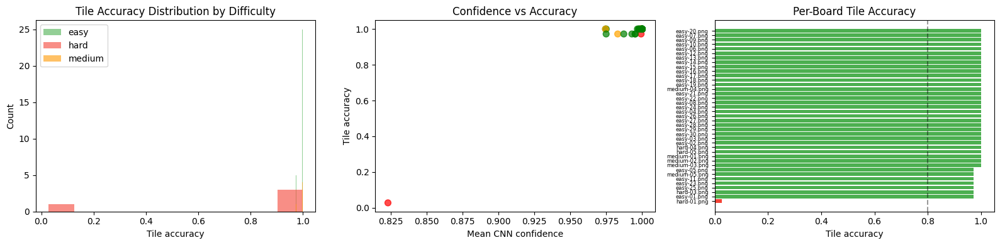

In [9]:
# Distribution of tile accuracy
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

scored = eval_df[eval_df["status"].isin(["OK", "GRID_MISMATCH"])]

colors = {"easy": "#4caf50", "medium": "#ff9800", "hard": "#f44336"}

for diff, grp in scored.groupby("difficulty"):
    axes[0].hist(grp["tile_accuracy"], bins=10, alpha=0.6, label=diff, color=colors[diff])
axes[0].set_xlabel("Tile accuracy")
axes[0].set_ylabel("Count")
axes[0].set_title("Tile Accuracy Distribution by Difficulty")
axes[0].legend()

axes[1].scatter(scored["mean_conf"], scored["tile_accuracy"],
                c=[{"easy": "green", "medium": "orange", "hard": "red"}[d] for d in scored["difficulty"]],
                alpha=0.7, s=50)
axes[1].set_xlabel("Mean CNN confidence")
axes[1].set_ylabel("Tile accuracy")
axes[1].set_title("Confidence vs Accuracy")

board_acc = scored.groupby("filename")["tile_accuracy"].mean().sort_values()
axes[2].barh(range(len(board_acc)), board_acc.values,
             color=["#f44336" if v < 0.5 else "#ff9800" if v < 0.8 else "#4caf50" for v in board_acc.values])
axes[2].set_yticks(range(len(board_acc)))
axes[2].set_yticklabels(board_acc.index, fontsize=6)
axes[2].set_xlabel("Tile accuracy")
axes[2].set_title("Per-Board Tile Accuracy")
axes[2].axvline(0.8, color="black", linestyle="--", alpha=0.4)

plt.tight_layout()
plt.show()


## F. Per-Letter Accuracy

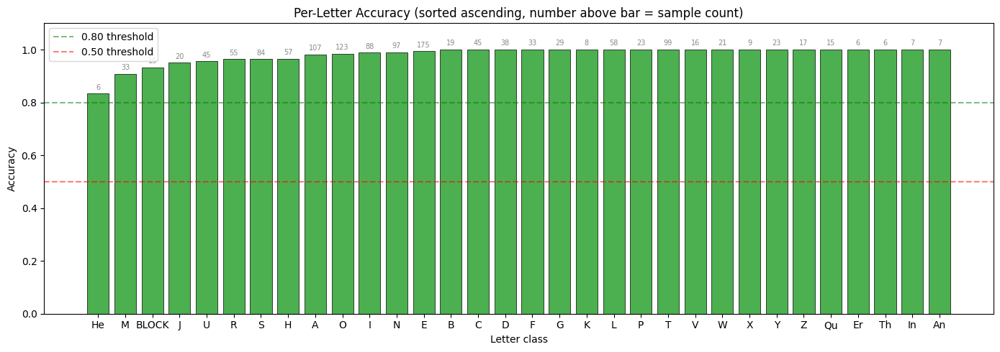


Bottom-10 classes by accuracy:
    He: 0.833  (5/6)
     M: 0.909  (30/33)
  BLOCK: 0.933  (14/15)
     J: 0.950  (19/20)
     U: 0.956  (43/45)
     R: 0.964  (53/55)
     S: 0.964  (81/84)
     H: 0.965  (55/57)
     A: 0.981  (105/107)
     O: 0.984  (121/123)


In [10]:
# Count correct/total for each GT label class
from collections import defaultdict

letter_correct = defaultdict(int)
letter_total = defaultdict(int)

for r in records:
    if "pred_labels" not in r or "gt_labels" not in r:
        continue
    pred = r["pred_labels"]
    gt = r["gt_labels"]
    n = min(len(pred), len(gt))
    for p, g in zip(pred[:n], gt[:n]):
        letter_total[g.upper()] += 1
        if p.upper() == g.upper():
            letter_correct[g.upper()] += 1

# Only include classes that appear in labeled data
label_accs = []
for label in CLASS_LABELS:
    total = letter_total[label.upper()]
    if total == 0:
        continue
    correct = letter_correct[label.upper()]
    label_accs.append((label, correct / total, total))

label_accs.sort(key=lambda x: x[1])  # sort by accuracy ascending

labels_sorted = [x[0] for x in label_accs]
accs_sorted = [x[1] for x in label_accs]
totals_sorted = [x[2] for x in label_accs]

fig, ax = plt.subplots(figsize=(14, 5))
bar_colors = ["#f44336" if a < 0.5 else "#ff9800" if a < 0.8 else "#4caf50" for a in accs_sorted]
bars = ax.bar(labels_sorted, accs_sorted, color=bar_colors, edgecolor="black", linewidth=0.5)

for bar, total in zip(bars, totals_sorted):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01,
            str(total), ha="center", va="bottom", fontsize=7, color="#888")

ax.axhline(0.8, color="green", linestyle="--", alpha=0.5, label="0.80 threshold")
ax.axhline(0.5, color="red", linestyle="--", alpha=0.5, label="0.50 threshold")
ax.set_xlabel("Letter class")
ax.set_ylabel("Accuracy")
ax.set_title("Per-Letter Accuracy (sorted ascending, number above bar = sample count)")
ax.set_ylim(0, 1.1)
ax.legend()
plt.tight_layout()
plt.show()

print("\nBottom-10 classes by accuracy:")
for label, acc, total in label_accs[:10]:
    print(f"  {label:>4s}: {acc:.3f}  ({letter_correct[label.upper()]}/{total})")


## G. Confusion Matrix (mispredicted tiles only)

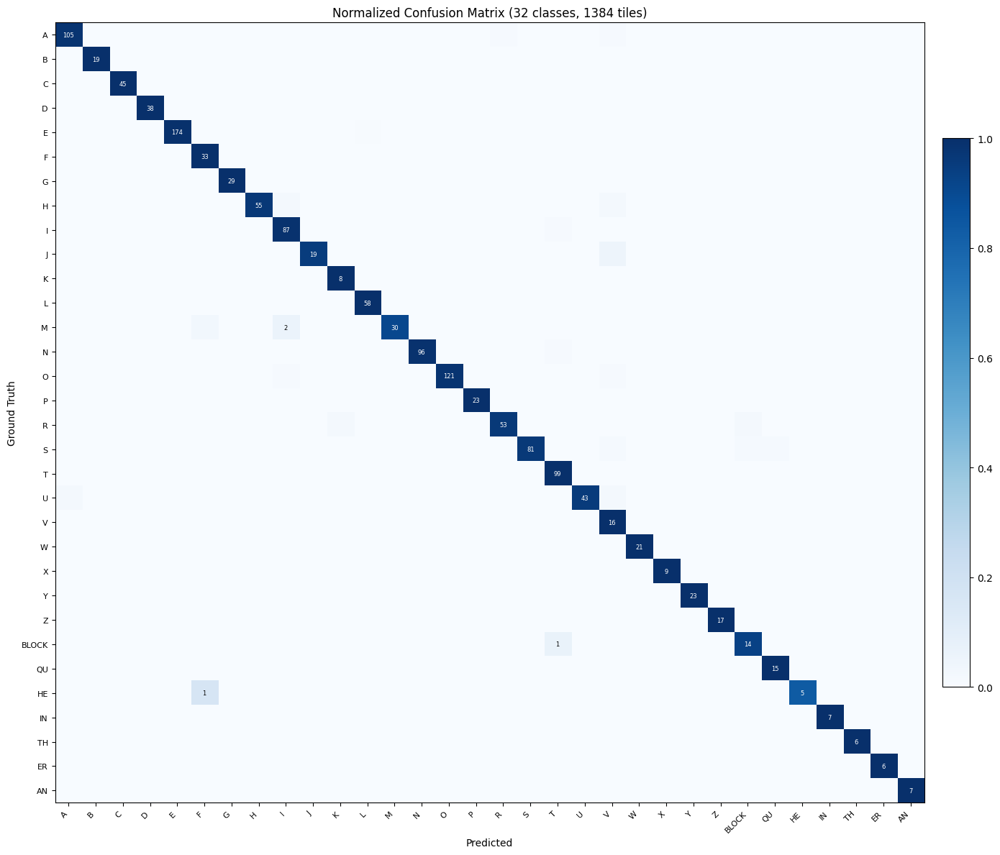


Top-10 mispredictions (GT → Pred, count):
     M → I   : 2
     U → V   : 1
     U → A   : 1
     S → V   : 1
     S → QU  : 1
     S → BLOCK: 1
     R → K   : 1
     R → BLOCK: 1
     O → V   : 1
     O → I   : 1


In [11]:
# Only include labels that appear in the labeled set
present_labels = sorted({g.upper() for r in records if "gt_labels" in r for g in r["gt_labels"]},
                        key=lambda l: CLASS_LABELS.index(l) if l in CLASS_LABELS else 999)

n_cls = len(present_labels)
label_to_idx = {l: i for i, l in enumerate(present_labels)}

conf_matrix = np.zeros((n_cls, n_cls), dtype=int)

for r in records:
    if "pred_labels" not in r or "gt_labels" not in r:
        continue
    pred_list = r["pred_labels"]
    gt_list = r["gt_labels"]
    n = min(len(pred_list), len(gt_list))
    for p, g in zip(pred_list[:n], gt_list[:n]):
        g_up, p_up = g.upper(), p.upper()
        if g_up in label_to_idx and p_up in label_to_idx:
            conf_matrix[label_to_idx[g_up], label_to_idx[p_up]] += 1

# Normalize by row (GT class)
row_sums = conf_matrix.sum(axis=1, keepdims=True).clip(min=1)
conf_norm = conf_matrix / row_sums

fig, ax = plt.subplots(figsize=(14, 12))
im = ax.imshow(conf_norm, cmap="Blues", vmin=0, vmax=1, aspect="auto")

ax.set_xticks(range(n_cls))
ax.set_yticks(range(n_cls))
ax.set_xticklabels(present_labels, rotation=45, ha="right", fontsize=8)
ax.set_yticklabels(present_labels, fontsize=8)
ax.set_xlabel("Predicted")
ax.set_ylabel("Ground Truth")
ax.set_title(f"Normalized Confusion Matrix ({n_cls} classes, {conf_matrix.sum()} tiles)")

# Annotate non-diagonal cells that have significant errors
for i in range(n_cls):
    for j in range(n_cls):
        v = conf_norm[i, j]
        if v > 0.05 or i == j:
            ax.text(j, i, f"{conf_matrix[i, j]}", ha="center", va="center",
                    fontsize=6, color="white" if v > 0.5 else "black")

plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02)
plt.tight_layout()
plt.show()

# Print top-10 confusions (off-diagonal)
print("\nTop-10 mispredictions (GT → Pred, count):")
off_diag = [(conf_matrix[i, j], present_labels[i], present_labels[j])
            for i in range(n_cls) for j in range(n_cls) if i != j and conf_matrix[i, j] > 0]
off_diag.sort(reverse=True)
for count, gt_l, pred_l in off_diag[:10]:
    print(f"  {gt_l:>4s} → {pred_l:<4s}: {count}")


## H. Failure & Low-Accuracy Boards

Diagnostic figures for boards that failed or had low tile accuracy.
Requires `show_pipeline_diagnostic` from notebook 04 — define it here or import from there.

In [12]:
def show_board_result(img_path, gt_labels=None, title=None):
    """2-row × 4-col diagnostic figure covering every pipeline stage.

    Row 0: Original photo | Warped board | Distance-transform heatmap + peaks | Tile grid overlay
    Row 1: First-row raw crops | First-row preprocessed | Prediction matrix | GT diff (or conf heatmap)
    """
    img_path = Path(img_path)
    image = cv2.imread(str(img_path))
    if image is None:
        print(f"Could not load {img_path}")
        return

    DARK, PANEL = "#1a1a1a", "#2a2a2a"
    fig, axes = plt.subplots(2, 4, figsize=(22, 10))
    fig.patch.set_facecolor(DARK)
    for ax in axes.flat:
        ax.set_facecolor(PANEL)
        ax.axis("off")

    def _t(ax, txt, color="white"):
        ax.set_title(txt, fontsize=8, color=color, pad=3)

    def _fail_from(idx, msg):
        for ax in axes.flat[idx:]:
            ax.text(0.5, 0.5, msg, ha="center", va="center",
                    transform=ax.transAxes, color="#ff6b6b", fontsize=9, wrap=True)

    # ── Row 0, col 0: Original photo (correct aspect ratio) ──────────────────
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axes[0, 0].imshow(rgb)
    _t(axes[0, 0], f"Original  {image.shape[1]}×{image.shape[0]}")

    # ── Detection ────────────────────────────────────────────────────────────
    mask, box, det_conf = detect_board(image, yolo_model)
    if mask is None:
        _fail_from(1, "FAIL: no board detected")
        fig.suptitle(title or img_path.name, color="#ff6b6b", fontsize=11)
        plt.tight_layout(pad=1)
        return fig

    clean = cleanup_mask(mask)
    corners, quad_method = fit_quad(clean)
    if corners is None:
        _fail_from(1, "FAIL: quad fit failed")
        fig.suptitle(title or img_path.name, color="#ff6b6b", fontsize=11)
        plt.tight_layout(pad=1)
        return fig

    warped, warp_sz = warp_board(image, corners)

    # ── Row 0, col 1: Warped board ────────────────────────────────────────────
    axes[0, 1].imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    _t(axes[0, 1], f"Warped  {warp_sz}×{warp_sz}  det={det_conf:.2f}")

    # ── Tile center detection (with debug for heatmap) ────────────────────────
    centroids, dbg = find_tile_centers(warped, debug=True)

    # ── Row 0, col 2: Distance-transform heatmap + kept peaks ────────────────
    if dbg is not None:
        dist = dbg["dist"]
        dist_u8 = (dist / dist.max() * 255).astype(np.uint8)
        hmap = cv2.applyColorMap(dist_u8, cv2.COLORMAP_INFERNO)
        axes[0, 2].imshow(cv2.cvtColor(hmap, cv2.COLOR_BGR2RGB))
        for cx, cy in centroids:
            axes[0, 2].plot(cx, cy, "o", color="#00ff88",
                            markersize=7, markeredgewidth=1.5, markeredgecolor="white")
    _t(axes[0, 2], f"Dist-transform heatmap  {len(centroids)} peaks after border filter")

    # ── Grid inference ────────────────────────────────────────────────────────
    gs, rows, cols, tsize = infer_grid_from_centroids(centroids, warped.shape)
    if gs == 0:
        _fail_from(3, f"FAIL: grid inference ({len(centroids)} peaks)")
        fig.suptitle(title or img_path.name, color="#ff6b6b", fontsize=11)
        plt.tight_layout(pad=1)
        return fig

    # ── Tile extraction + CNN (get tight bboxes for overlay) ─────────────────
    raw_tiles, tile_bboxes = extract_tiles_from_grid(warped, rows, cols, tsize,
                                                      centroids=centroids, return_bboxes=True)

    # ── Row 0, col 3: Warped board + tile grid overlay ────────────────────────
    overlay = warped.copy()
    h_img, w_img = warped.shape[:2]
    for x1, y1, x2, y2 in tile_bboxes:
        cv2.rectangle(overlay, (x1, y1), (x2, y2), (0, 220, 80), 3)
    axes[0, 3].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    _t(axes[0, 3], f"Tile grid  {gs}×{gs}  spacing≈{tsize:.0f}px")

    tile_imgs = [correct_tile_perspective(t) for t in raw_tiles]
    preprocessed = [preprocess_tile_v0(t) for t in tile_imgs]
    letters, confs = predict_tiles_batch(cnn_model, preprocessed)

    # ── Row 1, col 0: First row of raw tile crops ─────────────────────────────
    sub_r, sub_c, tile_px = 2, 3, 130
    grid_raw = np.full((tile_px * sub_r, tile_px * sub_c, 3), 40, dtype=np.uint8)
    for idx, t in enumerate(raw_tiles[: sub_r * sub_c]):
        r, c = divmod(idx, sub_c)
        if t.size == 0:
            continue
        t_rs = cv2.resize(t, (tile_px, tile_px))
        grid_raw[r * tile_px:(r+1) * tile_px, c * tile_px:(c+1) * tile_px] = (
            cv2.cvtColor(t_rs, cv2.COLOR_BGR2RGB)
        )
    axes[1, 0].imshow(grid_raw)
    _t(axes[1, 0], "Tiles 0–5 — raw crops (2×3)")

    # ── Row 1, col 1: 2×3 subgrid of preprocessed tiles ─────────────────────────────
    grid_pre = np.zeros((tile_px * sub_r, tile_px * sub_c), dtype=np.uint8)
    for idx, p in enumerate(preprocessed[: sub_r * sub_c]):
        r, c = divmod(idx, sub_c)
        grid_pre[r * tile_px:(r+1) * tile_px, c * tile_px:(c+1) * tile_px] = (
            cv2.resize(p, (tile_px, tile_px))
        )
    axes[1, 1].imshow(grid_pre, cmap="gray")
    _t(axes[1, 1], "Tiles 0–5 — preprocessed (v0, 2×3)")

    # ── Row 1, col 2: Prediction letter matrix ────────────────────────────────
    lm = np.array(letters).reshape(gs, gs)
    cm_arr = np.array(confs).reshape(gs, gs)
    ax_pred = axes[1, 2]
    ax_pred.set_facecolor("#111")
    ax_pred.set_xlim(-0.5, gs - 0.5)
    ax_pred.set_ylim(gs - 0.5, -0.5)
    for i in range(gs):
        for j in range(gs):
            c = cm_arr[i, j]
            col = "#4caf50" if c > 0.8 else "#ff9800" if c > 0.5 else "#f44336"
            ax_pred.text(j, i, lm[i, j], ha="center", va="center",
                         fontsize=11, fontweight="bold", color=col)
    ax_pred.set_xticks(range(gs))
    ax_pred.set_yticks(range(gs))
    ax_pred.tick_params(colors="gray", labelsize=6)
    ax_pred.grid(True, color="#333", linewidth=0.5)
    ax_pred.axis("on")
    _t(ax_pred, f"Predictions  mean={np.mean(confs):.3f}  min={min(confs):.3f}")

    # ── Row 1, col 3: GT diff (or confidence heatmap) ────────────────────────
    ax_last = axes[1, 3]
    if gt_labels is not None and len(gt_labels) == gs * gs:
        gtm = np.array(gt_labels).reshape(gs, gs)
        ax_last.set_facecolor("#111")
        ax_last.set_xlim(-0.5, gs - 0.5)
        ax_last.set_ylim(gs - 0.5, -0.5)
        n_correct = 0
        for i in range(gs):
            for j in range(gs):
                p, g = lm[i, j], gtm[i, j]
                ok = p.upper() == g.upper()
                n_correct += ok
                col = "#4caf50" if ok else "#f44336"
                label = p if ok else f"{p}\n({g})"
                ax_last.text(j, i, label, ha="center", va="center",
                             fontsize=8 if ok else 6, fontweight="bold", color=col)
        ax_last.set_xticks(range(gs))
        ax_last.set_yticks(range(gs))
        ax_last.tick_params(colors="gray", labelsize=6)
        ax_last.grid(True, color="#333", linewidth=0.5)
        ax_last.axis("on")
        acc = n_correct / (gs * gs)
        _t(ax_last, f"GT diff  acc={acc:.1%}  ({n_correct}/{gs*gs} correct)")
    else:
        conf_grid = np.array(confs).reshape(gs, gs)
        im = ax_last.imshow(conf_grid, cmap="RdYlGn", vmin=0, vmax=1, aspect="auto")
        plt.colorbar(im, ax=ax_last, fraction=0.046, pad=0.04)
        _t(ax_last, f"Confidence heatmap  min={min(confs):.2f}")

    fig.suptitle(title or img_path.name, fontsize=11, color="white", y=1.005)
    plt.tight_layout(pad=1.0)
    return fig

Showing diagnostics for 7 boards (failures + bottom-5 accuracy):
  hard-01.png                     [GRID_MISMATCH]  tile_acc=0.028


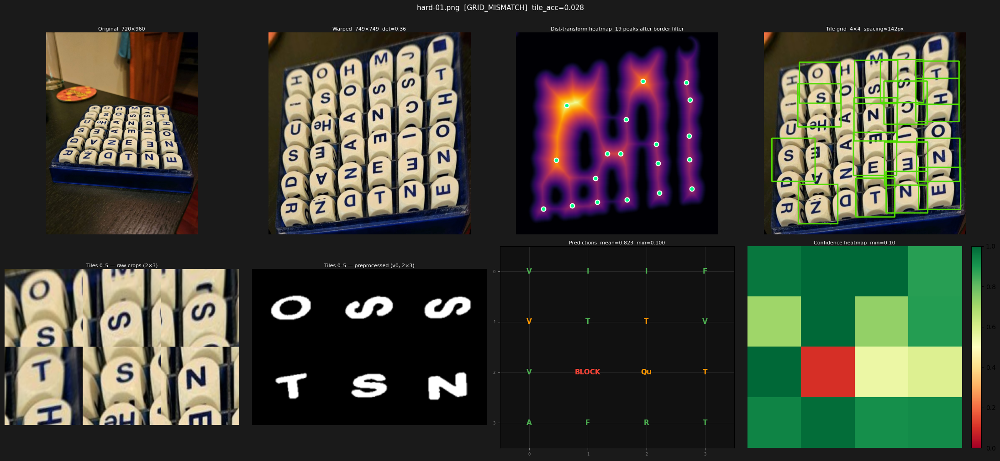

  hard-02.png                     [FAIL]  No board detected


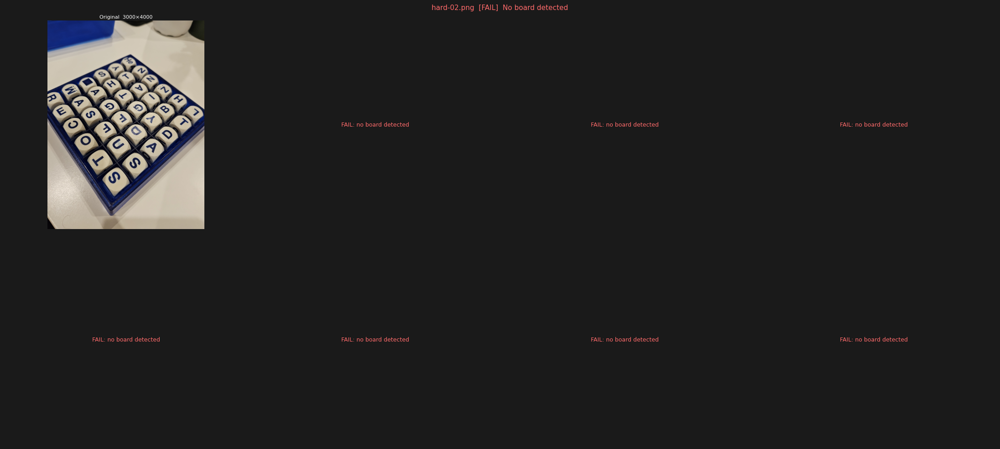

  easy-01.png                     [OK]  tile_acc=0.972


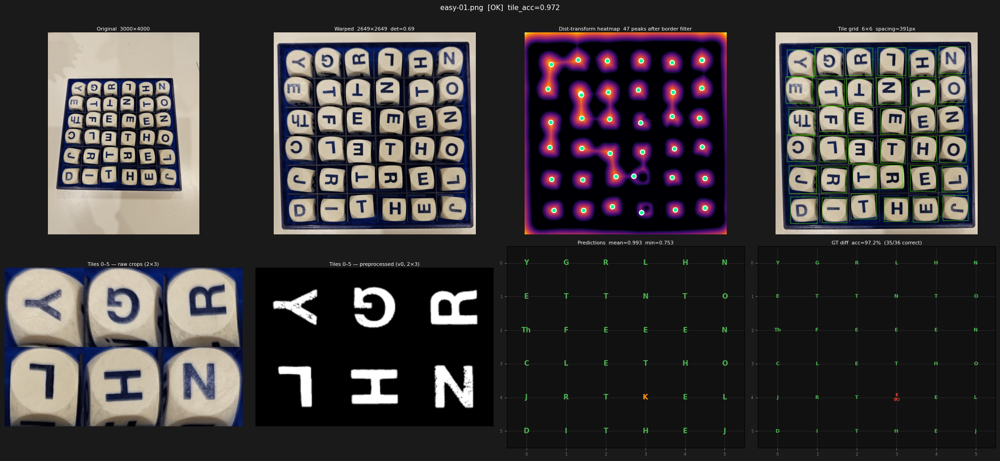

  medium-05.png                   [OK]  tile_acc=0.972


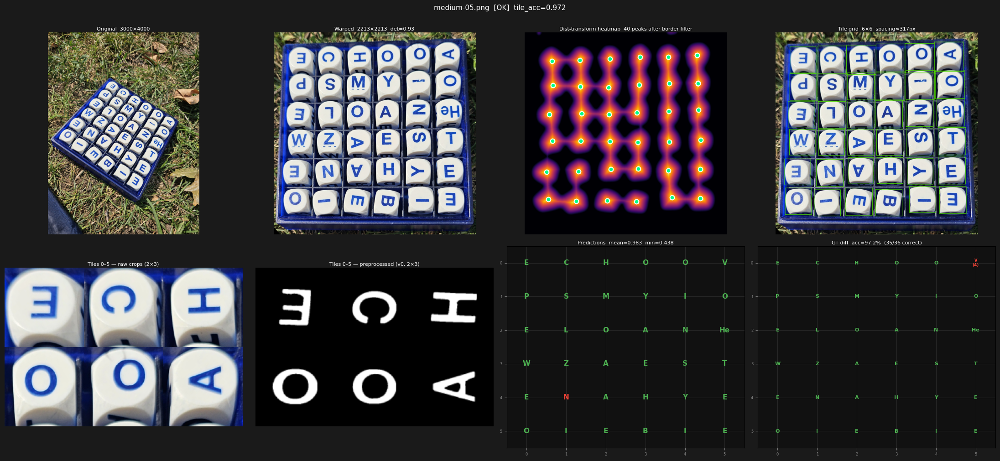

  easy-05.png                     [OK]  tile_acc=0.972


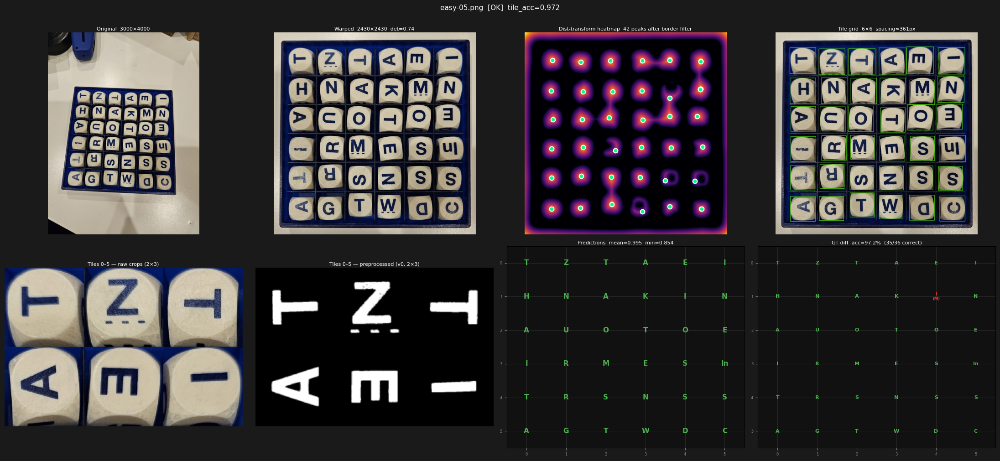

  hard-03.png                     [OK]  tile_acc=0.972


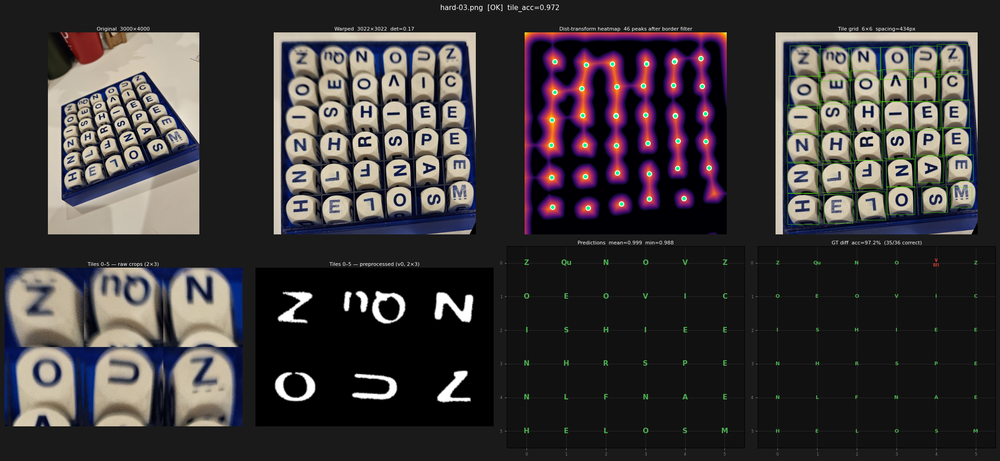

  easy-11.png                     [OK]  tile_acc=0.972


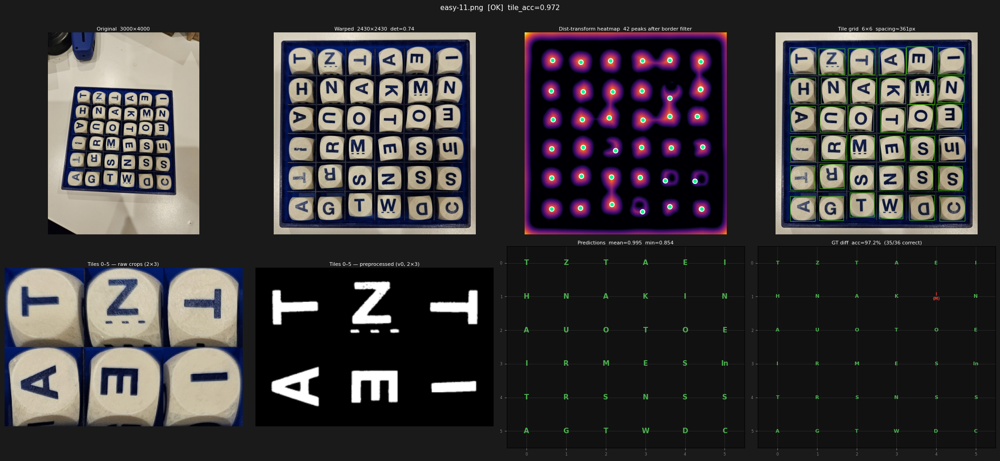

In [13]:
# Show diagnostics for failures and bottom-5 accuracy boards
fail_rows = eval_df[eval_df["status"].isin(["FAIL", "MISSING", "GRID_MISMATCH"])]
low_acc_rows = eval_df[eval_df["status"] == "OK"].nsmallest(5, "tile_accuracy")

show_rows = pd.concat([fail_rows, low_acc_rows]).drop_duplicates("filename")
print(f"Showing diagnostics for {len(show_rows)} boards (failures + bottom-5 accuracy):")

# Build a lookup from filename to record data
record_by_filename = {r.get("filename", ""): r for r in records}

for _, row in show_rows.iterrows():
    rec = record_by_filename.get(row["filename"], {})
    gt = rec.get("gt_labels", None)
    img_path = LABELED_RAW_DIR / row["filename"]

    status_str = f"[{row['status']}]"
    if row["status"] in ("OK", "GRID_MISMATCH"):
        acc_str = f"tile_acc={row['tile_accuracy']:.3f}"
    else:
        acc_str = row.get("error", "?")

    print(f"  {row['filename']:30s}  {status_str}  {acc_str}")
    fig = show_board_result(img_path, gt_labels=gt,
                            title=f"{row['filename']}  {status_str}  {acc_str}")
    plt.show()


## I. Summary

In [14]:
ok_df = eval_df[eval_df["status"] == "OK"]

print("=" * 60)
print("  PIPELINE ACCURACY EVALUATION SUMMARY")
print("=" * 60)
print(f"  Labeled boards:       {len(eval_df)}")
print(f"  Successful (OK):      {len(ok_df)}")
print(f"  Non-OK:               {len(eval_df) - len(ok_df)}  "
      f"({dict(eval_df[eval_df['status'] != 'OK']['status'].value_counts())})")

if len(ok_df) > 0:
    print()
    print(f"  Tile accuracy:        {ok_df['tile_accuracy'].mean():.3f}  "
          f"(±{ok_df['tile_accuracy'].std():.3f})")
    print(f"  Board exact match:    {ok_df['board_exact_match'].mean():.3f}  "
          f"({ok_df['board_exact_match'].sum()}/{len(ok_df)} boards)")
    print(f"  Mean CNN confidence:  {ok_df['mean_conf'].mean():.3f}")
    print(f"  Boards > 0.9 acc:     {(ok_df['tile_accuracy'] > 0.9).sum()}/{len(ok_df)}")
    print(f"  Boards < 0.5 acc:     {(ok_df['tile_accuracy'] < 0.5).sum()}/{len(ok_df)}")

print("=" * 60)


  PIPELINE ACCURACY EVALUATION SUMMARY
  Labeled boards:       40
  Successful (OK):      38
  Non-OK:               2  ({'GRID_MISMATCH': np.int64(1), 'FAIL': np.int64(1)})

  Tile accuracy:        0.995  (±0.011)
  Board exact match:    0.816  (31/38 boards)
  Mean CNN confidence:  0.996
  Boards > 0.9 acc:     38/38
  Boards < 0.5 acc:     0/38
